# Visualization: Integration Results

This notebook visualizes:
1. Method comparison (MARIO vs MaxFuse)
2. Joint embeddings (CCA, UMAP)
3. Spatial cell type mapping
4. Harmony batch correction

**Prerequisites**: Run `preprocessing.ipynb` and `integration.ipynb` first

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
from scipy import sparse
from scipy.io import mmread
import warnings
warnings.filterwarnings('ignore')

# Set plotting defaults
plt.rcParams['figure.figsize'] = [10, 8]
plt.rcParams['figure.dpi'] = 100
import pickle
import json
import os


In [2]:
# Load results from previous notebooks
# Run 1_preprocessing.ipynb and 2_integration.ipynb first

preprocess_dir = 'results/1_preprocessing'
integration_dir = 'results/2_integration'

# Check directories exist
for d in [preprocess_dir, integration_dir]:
    if not os.path.exists(d):
        raise FileNotFoundError(
            f"Results directory '{d}' not found. "
            f"Run the prerequisite notebooks first."
        )

# Check required files exist
required_files = [
    f'{preprocess_dir}/protein_adata.h5ad',
    f'{preprocess_dir}/rna_adata.h5ad',
    f'{preprocess_dir}/rna_adata_lognorm.h5ad',
    f'{integration_dir}/maxfuse_matching.pkl',
    f'{integration_dir}/rna_active.npy',
    f'{integration_dir}/protein_active.npy',
]
for f in required_files:
    if not os.path.exists(f):
        raise FileNotFoundError(
            f"Required file '{f}' not found. "
            f"Run the prerequisite notebooks first."
        )

# Load preprocessed data
protein_adata = sc.read_h5ad(f'{preprocess_dir}/protein_adata.h5ad')
rna_adata = sc.read_h5ad(f'{preprocess_dir}/rna_adata.h5ad')
rna_adata_lognorm = sc.read_h5ad(f'{preprocess_dir}/rna_adata_lognorm.h5ad')
print(f"Loaded preprocessed data:")
print(f"  Protein: {protein_adata.shape}")
print(f"  RNA: {rna_adata.shape}")

# Load integration results
with open(f'{integration_dir}/maxfuse_matching.pkl', 'rb') as f:
    matching_data = pickle.load(f)
full_matching = [matching_data['rna_indices'], matching_data['protein_indices'], matching_data['scores']]
print(f"\nLoaded MaxFuse matching: {len(full_matching[0])} matches")

# Load normalized arrays
rna_shared = np.load(f'{integration_dir}/rna_shared.npy')
rna_active = np.load(f'{integration_dir}/rna_active.npy')
protein_shared = np.load(f'{integration_dir}/protein_shared.npy')
protein_active = np.load(f'{integration_dir}/protein_active.npy')
print(f"Loaded normalized arrays:")
print(f"  rna_active: {rna_active.shape}")
print(f"  protein_active: {protein_active.shape}")

# Load integration parameters
with open(f'{integration_dir}/integration_params.json', 'r') as f:
    integration_params = json.load(f)

# Extract key variables needed downstream
n_rna = rna_adata.n_obs
n_prot = protein_adata.n_obs

print(f"\nReady for visualization")

Loaded preprocessed data:
  Protein: (172181, 26)
  RNA: (9374, 18626)

Loaded MaxFuse matching: 155230 matches
Loaded normalized arrays:
  rna_active: (9374, 18626)
  protein_active: (172181, 25)

Ready for visualization


## Step 8: Compare MaxFuse and MARIO Results

In [ ]:
# MaxFuse Integration Summary
# NOTE: MARIO results are not saved to checkpoint files.
# For MARIO comparison, run the cells in 2_integration.ipynb directly.

print("=" * 60)
print("MAXFUSE INTEGRATION RESULTS")
print("=" * 60)

print(f"\nData dimensions:")
print(f"  RNA cells: {n_rna:,}")
print(f"  Protein cells: {n_prot:,}")

print(f"\nMaxFuse matching results:")
print(f"  Total matches: {len(full_matching[0]):,}")
print(f"  Unique RNA cells matched: {len(np.unique(full_matching[0])):,}")
print(f"  Unique Protein cells matched: {len(np.unique(full_matching[1])):,}")
print(f"  Mean match score: {np.mean(full_matching[2]):.3f}")

# Load integration parameters if available
if os.path.exists(f'{integration_dir}/integration_params.json'):
    print(f"\nIntegration parameters:")
    for key, val in integration_params.get('fusor_params', {}).items():
        print(f"  {key}: {val}")

## Step 9: Joint Embedding and Visualization (MaxFuse)

**CRITICAL**: For good UMAP overlap between modalities, we need to:
1. **Refit CCA on the full matching** (not use the pivot-only CCA)
2. **Create aligned pairs** where matched RNA and protein cells have corresponding embeddings
3. **Use the matching to average multiple protein matches per RNA cell**

The default `get_embedding()` uses CCA fitted only on pivots, which doesn't generalize well.

In [ ]:
# NOTE: The Fusor object is not available when loading from checkpoint.
# We will use manual CCA fitting in the next cell instead.
# This approach is actually better because it fits CCA on the full matching,
# not just the pivots that Fusor uses internally.

print("Skipping Fusor-based embedding (not available from checkpoint)")
print("Using manual CCA fitting in next cell instead - this is the recommended approach.")

In [3]:
# Alternative approach: Create aligned embeddings manually for better control
# This ensures matched cells end up close together in the embedding

from sklearn.cross_decomposition import CCA

# Build aligned arrays from the matching
# Group matches by RNA cell and average protein cells
rna_to_prot_matches = {}
for rna_idx, prot_idx, score in zip(full_matching[0], full_matching[1], full_matching[2]):
    if rna_idx not in rna_to_prot_matches:
        rna_to_prot_matches[rna_idx] = []
    rna_to_prot_matches[rna_idx].append((prot_idx, score))

# Create aligned arrays
aligned_rna = []
aligned_prot = []
aligned_rna_indices = []

for rna_idx, matches in rna_to_prot_matches.items():
    prot_indices = [m[0] for m in matches]
    # Average the matched protein cells
    aligned_rna.append(rna_active[rna_idx])
    aligned_prot.append(protein_active[prot_indices].mean(axis=0))
    aligned_rna_indices.append(rna_idx)

aligned_rna = np.array(aligned_rna)
aligned_prot = np.array(aligned_prot)
aligned_rna_indices = np.array(aligned_rna_indices)

print(f"Aligned arrays:")
print(f"  RNA: {aligned_rna.shape}")
print(f"  Protein: {aligned_prot.shape}")
print(f"  Unique RNA cells with matches: {len(aligned_rna_indices)}")

Aligned arrays:
  RNA: (5284, 18626)
  Protein: (5284, 25)
  Unique RNA cells with matches: 5284


Original shapes: RNA (5284, 18626), Protein (5284, 25)

Step 1: Reducing RNA to 25 SVD components...
  Variance explained: 95.9%
  Reduced RNA shape: (5284, 25)

Step 2: Fitting PLS with 8 components...

Canonical correlations: [0.787 0.692 0.839 0.63  0.627 0.583 0.53  0.509]
Mean: 0.650


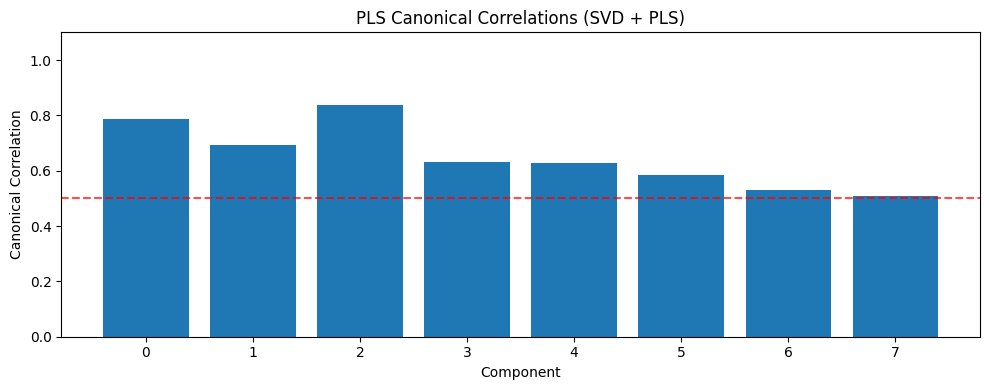

In [5]:
# Fit CCA on the aligned pairs
# Two-step approach to prevent overfitting:
# 1. SVD to reduce RNA from 18k features to ~50
# 2. PLS (regularized CCA) on the reduced data

from sklearn.decomposition import TruncatedSVD
from sklearn.cross_decomposition import PLSCanonical
from sklearn.preprocessing import StandardScaler

print(f"Original shapes: RNA {aligned_rna.shape}, Protein {aligned_prot.shape}")

# Step 1: Reduce RNA dimensionality with SVD
n_svd = min(50, aligned_prot.shape[1], aligned_rna.shape[0] // 50)
print(f"\nStep 1: Reducing RNA to {n_svd} SVD components...")

svd = TruncatedSVD(n_components=n_svd, random_state=42)
rna_reduced = svd.fit_transform(aligned_rna)
print(f"  Variance explained: {svd.explained_variance_ratio_.sum():.1%}")
print(f"  Reduced RNA shape: {rna_reduced.shape}")

# Step 2: Standardize both matrices
scaler_rna = StandardScaler()
scaler_prot = StandardScaler()
rna_scaled = scaler_rna.fit_transform(rna_reduced)
prot_scaled = scaler_prot.fit_transform(aligned_prot)

# Step 3: PLS with conservative components
n_cca_components = min(15, n_svd - 1, aligned_prot.shape[1] // 3)
print(f"\nStep 2: Fitting PLS with {n_cca_components} components...")

pls = PLSCanonical(n_components=n_cca_components, max_iter=1000)
pls.fit(rna_scaled, prot_scaled)

# Get scores using transform()
rna_cca_scores, prot_cca_scores = pls.transform(rna_scaled, prot_scaled)

# Compute correlations
cancor = np.array([np.corrcoef(rna_cca_scores[:, i], prot_cca_scores[:, i])[0, 1] 
                   for i in range(n_cca_components)])
print(f"\nCanonical correlations: {cancor.round(3)}")
print(f"Mean: {cancor.mean():.3f}")

# Plot
plt.figure(figsize=(10, 4))
plt.bar(range(len(cancor)), cancor)
plt.xlabel('Component')
plt.ylabel('Canonical Correlation')
plt.ylim(0, 1.1)
plt.title('PLS Canonical Correlations (SVD + PLS)')
plt.axhline(y=0.5, color='r', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [6]:
# Create joint embedding for visualization
# KEY INSIGHT: CCA produces X_c and Y_c that are correlated but may have different scales
# For TRUE overlap, we should AVERAGE the CCA scores of matched pairs

# Method 1: Average CCA scores (creates single unified embedding)
# This is what Seurat and other integration methods do
unified_embedding = (rna_cca_scores + prot_cca_scores) / 2

# Method 2: Concatenate but use the same embedding twice (original approach - shown for comparison)
# This keeps modalities separate but aligned
combined_cca = np.vstack([rna_cca_scores, prot_cca_scores])

print(f"Unified embedding (averaged): {unified_embedding.shape}")
print(f"Combined embedding (stacked): {combined_cca.shape}")

# Check how different the RNA and Protein CCA scores are
score_diff = np.abs(rna_cca_scores - prot_cca_scores)
print(f"\nDifference between RNA and Protein CCA scores:")
print(f"  Mean absolute difference: {score_diff.mean():.3f}")
print(f"  Max absolute difference: {score_diff.max():.3f}")

# For UMAP, we'll use the UNIFIED embedding (averaged) 
# and add both RNA and Protein markers to the same points
cca_adata_unified = ad.AnnData(unified_embedding.astype(np.float32))
cca_adata_unified.obs_names = [f"cell_{i}" for i in range(len(unified_embedding))]

# Also create the stacked version for comparison
modality_labels = ['RNA'] * len(rna_cca_scores) + ['Protein'] * len(prot_cca_scores)
cca_adata = ad.AnnData(combined_cca.astype(np.float32))
cca_adata.obs['modality'] = modality_labels
cca_adata.obs['pair_id'] = list(range(len(rna_cca_scores))) + list(range(len(prot_cca_scores)))

print(f"\nUnified AnnData: {cca_adata_unified.shape}")
print(f"Stacked AnnData: {cca_adata.shape}")

Unified embedding (averaged): (5284, 8)
Combined embedding (stacked): (10568, 8)

Difference between RNA and Protein CCA scores:
  Mean absolute difference: 0.695
  Max absolute difference: 17.429

Unified AnnData: (5284, 8)
Stacked AnnData: (10568, 8)


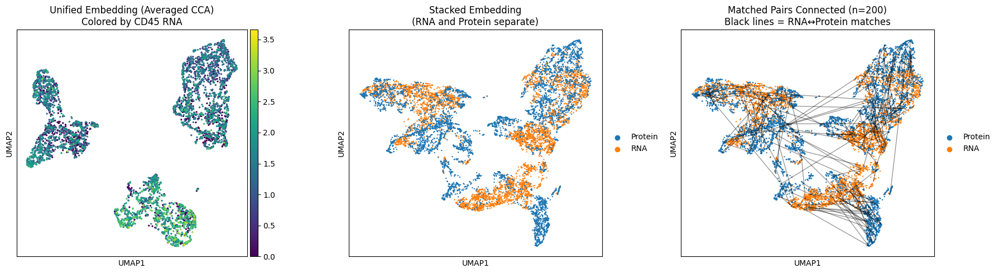


Matched pair distances in UMAP:
  Mean: 5.67
  Median: 4.89
  (Shorter distances = better integration)


In [8]:
# Compute UMAP on BOTH embeddings and compare

# 1. Unified embedding (averaged CCA scores) - TRUE integration
sc.pp.neighbors(cca_adata_unified, n_neighbors=15, use_rep='X')
sc.tl.umap(cca_adata_unified, min_dist=0.01, spread=2.5)

# 2. Stacked embedding (RNA and Protein separate)
sc.pp.neighbors(cca_adata, n_neighbors=15, use_rep='X')
sc.tl.umap(cca_adata, min_dist=0.01, spread=2.5)

# Plot comparison
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Unified embedding - colored by a marker (no modality split)
cd45_expr = np.zeros(len(unified_embedding))
if 'PTPRC' in rna_adata_lognorm.var_names:
    cd45_idx = list(rna_adata_lognorm.var_names).index('PTPRC')
    cd45_vals = rna_adata_lognorm.X[:, cd45_idx]
    if sparse.issparse(cd45_vals):
        cd45_vals = cd45_vals.toarray().flatten()
    cd45_expr = cd45_vals[aligned_rna_indices]
cca_adata_unified.obs['CD45_RNA'] = cd45_expr

sc.pl.umap(cca_adata_unified, color='CD45_RNA', ax=axes[0], show=False,
           title='Unified Embedding (Averaged CCA)\nColored by CD45 RNA', cmap='viridis')

# Stacked embedding - colored by modality
sc.pl.umap(cca_adata, color='modality', ax=axes[1], show=False,
           title='Stacked Embedding\n(RNA and Protein separate)')

# Stacked embedding with connecting lines - draw scatter FIRST, then lines ON TOP
sc.pl.umap(cca_adata, color='modality', ax=axes[2], show=False,
           title='Stacked with Matched Pairs Connected')

# Now draw connecting lines ON TOP of the scatter
umap_coords = cca_adata.obsm['X_umap']
n_pairs = len(rna_cca_scores)
n_show_pairs = 200
np.random.seed(42)
pair_sample = np.random.choice(n_pairs, min(n_show_pairs, n_pairs), replace=False)

for pair_idx in pair_sample:
    rna_umap = umap_coords[pair_idx]
    prot_umap = umap_coords[n_pairs + pair_idx]
    # Draw lines with higher visibility: thicker, darker, on top
    axes[2].plot([rna_umap[0], prot_umap[0]], [rna_umap[1], prot_umap[1]], 
                 color='black', alpha=0.4, linewidth=1.0, zorder=10)

axes[2].set_title(f'Matched Pairs Connected (n={n_show_pairs})\nBlack lines = RNA↔Protein matches')

plt.tight_layout()
plt.show()

# Quantify separation
matched_distances = np.linalg.norm(umap_coords[:n_pairs] - umap_coords[n_pairs:], axis=1)
print(f"\nMatched pair distances in UMAP:")
print(f"  Mean: {matched_distances.mean():.2f}")
print(f"  Median: {np.median(matched_distances):.2f}")
print(f"  (Shorter distances = better integration)")

MATCHED PAIR DISTANCE ANALYSIS

Distance Statistics (all 5284 matched pairs):
  Mean:   5.67
  Median: 4.89
  Std:    3.90
  Min:    0.02
  Max:    28.98

Outliers (distance > 13.46): 238 pairs (4.5%)


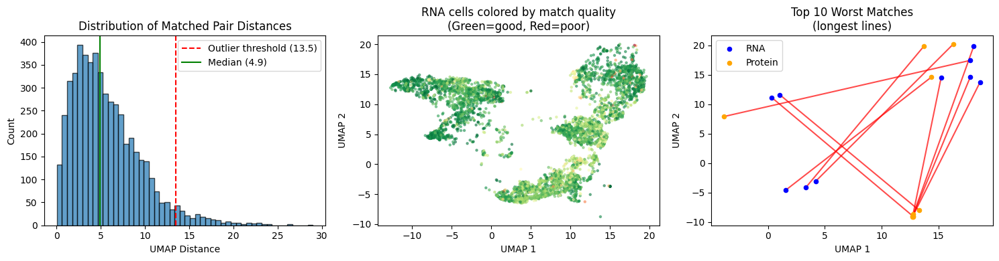


RECOMMENDATIONS

✓ LOW OUTLIER RATE (<5%)
   Integration quality looks good!

To filter outliers, you could add:
   good_matches = pair_dist_df[pair_dist_df['distance'] <= 13.5]

MARKER EXPRESSION IN OUTLIER PAIRS

Analyzing 238 outlier pairs...

Mean expression in OUTLIERS vs ALL matched pairs:
Marker              Outliers    All Pairs   Difference
-------------------------------------------------------
CD45/PTPRC             1.096        1.135       -0.039
CD3/CD3E               0.201        0.190       +0.011
CD20/MS4A1             1.094        0.786       +0.307
CD8/CD8A               0.087        0.087       +0.000
CD68                   0.305        0.478       -0.174
CD31/PECAM1            0.199        0.164       +0.036

Outlier pairs tend to be cells with:
  - HIGHER CD20/MS4A1 expression
  - LOWER CD68 expression

Protein marker expression in outlier-matched CODEX cells:
Protein          Outliers  All Matches
----------------------------------------
CD45               19.389

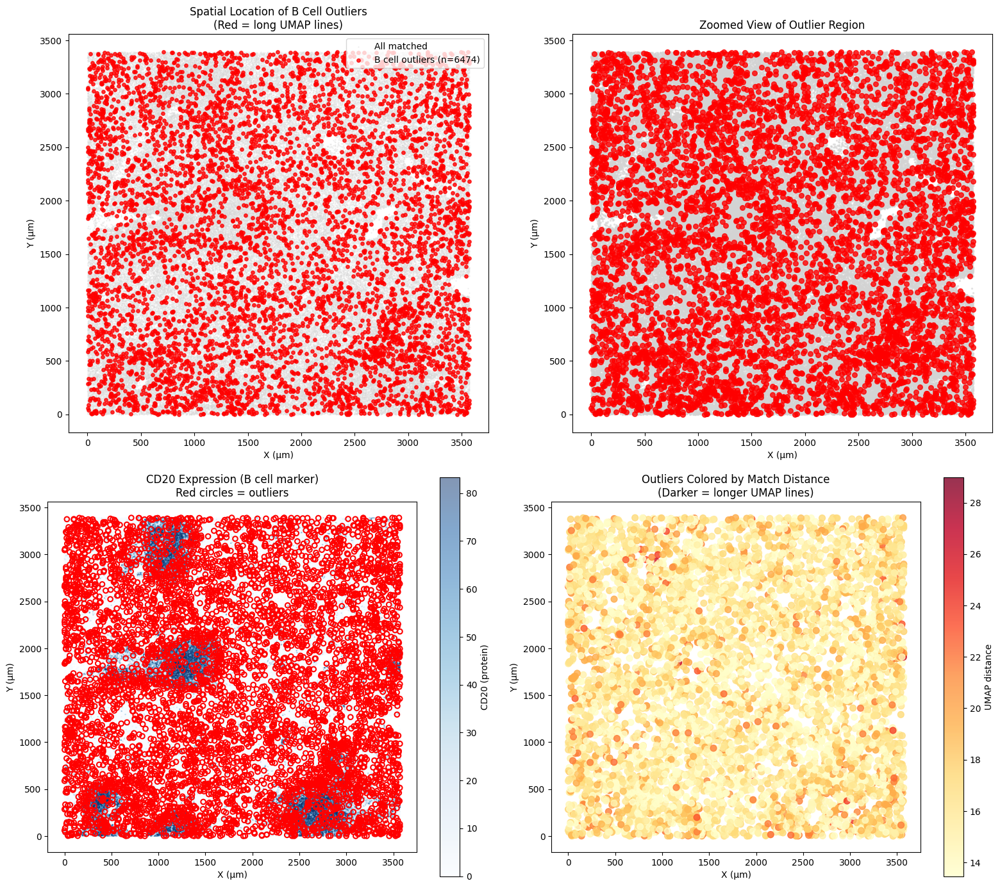


Spatial distribution of outliers:
  X range: 1 - 3571 µm
  Y range: 1 - 3390 µm
  Center: (1723, 1591) µm

  Median pairwise distance (outliers): 1856 µm
  Median pairwise distance (all cells): 1773 µm

  → Outliers have similar spatial spread as other cells

Figure saved to: spleen_outlier_spatial.png


In [ ]:
# DIAGNOSTIC: Investigate long connecting lines (potential mismatches)
print("="*60)
print("MATCHED PAIR DISTANCE ANALYSIS")
print("="*60)

# Calculate distances for all matched pairs
umap_coords = cca_adata.obsm['X_umap']
n_pairs = len(rna_cca_scores)

pair_distances = []
for i in range(n_pairs):
    rna_umap = umap_coords[i]
    prot_umap = umap_coords[n_pairs + i]
    dist = np.linalg.norm(rna_umap - prot_umap)
    pair_distances.append({
        'pair_idx': i,
        'rna_idx': aligned_rna_indices[i],
        'distance': dist,
        'rna_umap_x': rna_umap[0],
        'rna_umap_y': rna_umap[1],
        'prot_umap_x': prot_umap[0],
        'prot_umap_y': prot_umap[1]
    })

pair_dist_df = pd.DataFrame(pair_distances)

# Statistics
print(f"\nDistance Statistics (all {n_pairs} matched pairs):")
print(f"  Mean:   {pair_dist_df['distance'].mean():.2f}")
print(f"  Median: {pair_dist_df['distance'].median():.2f}")
print(f"  Std:    {pair_dist_df['distance'].std():.2f}")
print(f"  Min:    {pair_dist_df['distance'].min():.2f}")
print(f"  Max:    {pair_dist_df['distance'].max():.2f}")

# Identify outliers (>2 std from mean)
threshold = pair_dist_df['distance'].mean() + 2 * pair_dist_df['distance'].std()
outliers = pair_dist_df[pair_dist_df['distance'] > threshold]
print(f"\nOutliers (distance > {threshold:.2f}): {len(outliers)} pairs ({100*len(outliers)/n_pairs:.1f}%)")

# Plot distribution
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Histogram of distances
axes[0].hist(pair_dist_df['distance'], bins=50, edgecolor='black', alpha=0.7)
axes[0].axvline(threshold, color='red', linestyle='--', label=f'Outlier threshold ({threshold:.1f})')
axes[0].axvline(pair_dist_df['distance'].median(), color='green', linestyle='-', label=f'Median ({pair_dist_df["distance"].median():.1f})')
axes[0].set_xlabel('UMAP Distance')
axes[0].set_ylabel('Count')
axes[0].set_title('Distribution of Matched Pair Distances')
axes[0].legend()

# UMAP colored by match quality
match_quality = 1 - (pair_dist_df['distance'] / pair_dist_df['distance'].max())
axes[1].scatter(pair_dist_df['rna_umap_x'], pair_dist_df['rna_umap_y'], 
                c=match_quality, cmap='RdYlGn', s=5, alpha=0.5)
axes[1].set_xlabel('UMAP 1')
axes[1].set_ylabel('UMAP 2')
axes[1].set_title('RNA cells colored by match quality\n(Green=good, Red=poor)')

# Show worst matches
if len(outliers) > 0:
    worst_10 = pair_dist_df.nlargest(min(10, len(outliers)), 'distance')
    for _, row in worst_10.iterrows():
        axes[2].plot([row['rna_umap_x'], row['prot_umap_x']], 
                     [row['rna_umap_y'], row['prot_umap_y']], 
                     'r-', alpha=0.7, linewidth=1.5)
    axes[2].scatter(worst_10['rna_umap_x'], worst_10['rna_umap_y'], c='blue', s=20, label='RNA', zorder=5)
    axes[2].scatter(worst_10['prot_umap_x'], worst_10['prot_umap_y'], c='orange', s=20, label='Protein', zorder=5)
    axes[2].set_xlabel('UMAP 1')
    axes[2].set_ylabel('UMAP 2')
    axes[2].set_title(f'Top {len(worst_10)} Worst Matches\n(longest lines)')
    axes[2].legend()

plt.tight_layout()
plt.show()

# Recommendations
print("\n" + "="*60)
print("RECOMMENDATIONS")
print("="*60)
if len(outliers) / n_pairs > 0.1:
    print("\n⚠️  HIGH OUTLIER RATE (>10%)")
    print("   Consider:")
    print("   1. Increase filter_prop in MaxFuse to remove more bad matches")
    print("   2. Check if specific cell types are causing mismatches")
    print("   3. Verify shared feature quality between modalities")
elif len(outliers) / n_pairs > 0.05:
    print("\n⚡ MODERATE OUTLIER RATE (5-10%)")
    print("   Some mismatches are normal. Consider filtering worst matches.")
else:
    print("\n✓ LOW OUTLIER RATE (<5%)")
    print("   Integration quality looks good!")

# Optional: Filter out worst matches
print(f"\nTo filter outliers, you could add:")
print(f"   good_matches = pair_dist_df[pair_dist_df['distance'] <= {threshold:.1f}]")

# ADDITIONAL ANALYSIS: Marker expression in outlier pairs
print("\n" + "="*60)
print("MARKER EXPRESSION IN OUTLIER PAIRS")
print("="*60)

if len(outliers) > 0:
    # Get the RNA indices for outliers
    outlier_rna_indices = [aligned_rna_indices[idx] for idx in outliers['pair_idx'].values]
    
    # Key markers to check
    markers_to_check = {
        'CD45/PTPRC': 'PTPRC',
        'CD3/CD3E': 'CD3E', 
        'CD20/MS4A1': 'MS4A1',
        'CD8/CD8A': 'CD8A',
        'CD68': 'CD68',
        'CD31/PECAM1': 'PECAM1',
    }
    
    print(f"\nAnalyzing {len(outliers)} outlier pairs...")
    print(f"\nMean expression in OUTLIERS vs ALL matched pairs:")
    print(f"{'Marker':<15} {'Outliers':>12} {'All Pairs':>12} {'Difference':>12}")
    print("-"*55)
    marker_diffs = []
    for marker_name, rna_gene in markers_to_check.items():
        if rna_gene in rna_adata_lognorm.var_names:
            gene_idx = list(rna_adata_lognorm.var_names).index(rna_gene)
            all_vals = rna_adata_lognorm.X[:, gene_idx]
            if hasattr(all_vals, 'toarray'):
                all_vals = all_vals.toarray().flatten()
            
            # Expression in outlier RNA cells
            outlier_expr = all_vals[outlier_rna_indices].mean()
            # Expression in all matched RNA cells  
            all_matched_expr = all_vals[aligned_rna_indices].mean()
            
            diff = outlier_expr - all_matched_expr
            marker_diffs.append((marker_name, outlier_expr, all_matched_expr, diff))
            print(f"{marker_name:<15} {outlier_expr:>12.3f} {all_matched_expr:>12.3f} {diff:>+12.3f}")
    
    # Find which markers are most different in outliers
    marker_diffs.sort(key=lambda x: abs(x[3]), reverse=True)
    
    print(f"\nOutlier pairs tend to be cells with:")
    for name, out_expr, all_expr, diff in marker_diffs[:3]:
        if abs(diff) > 0.1:
            direction = "HIGHER" if diff > 0 else "LOWER"
            print(f"  - {direction} {name} expression")
    
    # Show protein expression for corresponding matched protein cells
    print(f"\nProtein marker expression in outlier-matched CODEX cells:")
    prot_markers = ['CD45', 'CD3e', 'CD20', 'CD8', 'CD68', 'CD31']
    available_prot = [m for m in prot_markers if m in protein_adata.var_names]
    
    if available_prot:
        # Get protein indices for outliers
        outlier_prot_indices = []
        for pair_idx in outliers['pair_idx'].values:
            rna_idx = aligned_rna_indices[pair_idx]
            if rna_idx in rna_to_prot_matches:
                prot_idx = rna_to_prot_matches[rna_idx][0][0]  # First match
                outlier_prot_indices.append(prot_idx)
        
        print(f"{'Protein':<12} {'Outliers':>12} {'All Matches':>12}")
        print("-"*40)
        for marker in available_prot:
            prot_idx = list(protein_adata.var_names).index(marker)
            outlier_prot_expr = protein_adata.X[outlier_prot_indices, prot_idx].mean()
            all_prot_expr = protein_adata.X[:, prot_idx].mean()
            print(f"{marker:<12} {outlier_prot_expr:>12.3f} {all_prot_expr:>12.3f}")

    # Note: Cluster distribution analysis available after running Harmony (cells below)
    print(f"\nNote: Run Harmony batch correction cells below for cluster analysis of outliers")
else:
    print("No outliers to analyze!")

# SPATIAL VISUALIZATION: Where are the B cell outliers?
print("\n" + "="*60)
print("SPATIAL LOCATION OF OUTLIER PAIRS")
print("="*60)

if len(outliers) > 0:
    # Get spatial coordinates for outlier protein cells
    outlier_spatial = []
    for pair_idx in outliers['pair_idx'].values:
        rna_idx = aligned_rna_indices[pair_idx]
        if rna_idx in rna_to_prot_matches:
            for prot_idx, score in rna_to_prot_matches[rna_idx]:
                outlier_spatial.append({
                    'x': protein_adata.obs['X_centroid'].values[prot_idx],
                    'y': protein_adata.obs['Y_centroid'].values[prot_idx],
                    'prot_idx': prot_idx,
                    'rna_idx': rna_idx,
                    'distance': outliers[outliers['pair_idx'] == pair_idx]['distance'].values[0]
                })
    
    outlier_spatial_df = pd.DataFrame(outlier_spatial)
    
    # Create spatial_df for all matched cells (needed for background plotting)
    all_spatial = []
    for rna_idx, matches in rna_to_prot_matches.items():
        for prot_idx, score in matches:
            all_spatial.append({
                'x': protein_adata.obs['X_centroid'].values[prot_idx],
                'y': protein_adata.obs['Y_centroid'].values[prot_idx],
                'protein_idx': prot_idx,
                'rna_idx': rna_idx
            })
    spatial_df = pd.DataFrame(all_spatial)
    
    # Create figure with multiple views
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    
    # Panel 1: All cells with outliers highlighted
    ax = axes[0, 0]
    # Plot all matched cells in gray
    ax.scatter(spatial_df['x'], spatial_df['y'], c='lightgray', s=0.5, alpha=0.3, label='All matched')
    # Highlight outliers in red
    ax.scatter(outlier_spatial_df['x'], outlier_spatial_df['y'], c='red', s=15, alpha=0.8, 
               label=f'B cell outliers (n={len(outlier_spatial_df)})', zorder=5)
    ax.set_xlabel('X (µm)')
    ax.set_ylabel('Y (µm)')
    ax.set_title('Spatial Location of B Cell Outliers\n(Red = long UMAP lines)')
    ax.legend(loc='upper right')
    ax.set_aspect('equal')
    
    # Panel 2: Zoom into region with most outliers
    ax = axes[0, 1]
    # Find the densest region of outliers
    x_center = outlier_spatial_df['x'].median()
    y_center = outlier_spatial_df['y'].median()
    x_range = outlier_spatial_df['x'].std() * 4
    y_range = outlier_spatial_df['y'].std() * 4
    
    # Plot zoomed region
    zoom_mask = (
        (spatial_df['x'] > x_center - x_range) & (spatial_df['x'] < x_center + x_range) &
        (spatial_df['y'] > y_center - y_range) & (spatial_df['y'] < y_center + y_range)
    )
    ax.scatter(spatial_df.loc[zoom_mask, 'x'], spatial_df.loc[zoom_mask, 'y'], 
               c='lightgray', s=2, alpha=0.5)
    
    zoom_outliers = (
        (outlier_spatial_df['x'] > x_center - x_range) & (outlier_spatial_df['x'] < x_center + x_range) &
        (outlier_spatial_df['y'] > y_center - y_range) & (outlier_spatial_df['y'] < y_center + y_range)
    )
    ax.scatter(outlier_spatial_df.loc[zoom_outliers, 'x'], outlier_spatial_df.loc[zoom_outliers, 'y'], 
               c='red', s=30, alpha=0.8, zorder=5)
    ax.set_xlabel('X (µm)')
    ax.set_ylabel('Y (µm)')
    ax.set_title('Zoomed View of Outlier Region')
    ax.set_aspect('equal')
    
    # Panel 3: CD20 expression across tissue with outliers marked
    ax = axes[1, 0]
    if 'CD20' in protein_adata.var_names:
        cd20_idx = list(protein_adata.var_names).index('CD20')
        # Get CD20 expression for all matched protein cells
        cd20_vals = []
        for idx in spatial_df['protein_idx'].values:
            cd20_vals.append(protein_adata.X[idx, cd20_idx])
        
        scatter = ax.scatter(spatial_df['x'], spatial_df['y'], c=cd20_vals, 
                            cmap='Blues', s=0.5, alpha=0.5, vmin=0, vmax=np.percentile(cd20_vals, 95))
        ax.scatter(outlier_spatial_df['x'], outlier_spatial_df['y'], 
                   facecolors='none', edgecolors='red', s=30, linewidth=1.5, label='Outliers', zorder=5)
        plt.colorbar(scatter, ax=ax, label='CD20 (protein)')
        ax.set_xlabel('X (µm)')
        ax.set_ylabel('Y (µm)')
        ax.set_title('CD20 Expression (B cell marker)\nRed circles = outliers')
        ax.set_aspect('equal')
    
    # Panel 4: Outliers colored by match distance
    ax = axes[1, 1]
    scatter = ax.scatter(outlier_spatial_df['x'], outlier_spatial_df['y'], 
                        c=outlier_spatial_df['distance'], cmap='YlOrRd', s=50, alpha=0.8)
    plt.colorbar(scatter, ax=ax, label='UMAP distance')
    ax.set_xlabel('X (µm)')
    ax.set_ylabel('Y (µm)')
    ax.set_title('Outliers Colored by Match Distance\n(Darker = longer UMAP lines)')
    ax.set_aspect('equal')
    
    plt.tight_layout()
    plt.savefig('spleen_outlier_spatial.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # Summary statistics
    print(f"\nSpatial distribution of outliers:")
    print(f"  X range: {outlier_spatial_df['x'].min():.0f} - {outlier_spatial_df['x'].max():.0f} µm")
    print(f"  Y range: {outlier_spatial_df['y'].min():.0f} - {outlier_spatial_df['y'].max():.0f} µm")
    print(f"  Center: ({outlier_spatial_df['x'].median():.0f}, {outlier_spatial_df['y'].median():.0f}) µm")
    
    # Check if outliers are clustered or dispersed
    from scipy.spatial.distance import pdist
    if len(outlier_spatial_df) > 2:
        outlier_coords = outlier_spatial_df[['x', 'y']].values
        all_coords = spatial_df[['x', 'y']].sample(min(1000, len(spatial_df))).values
        
        outlier_spread = np.median(pdist(outlier_coords))
        all_spread = np.median(pdist(all_coords))
        
        print(f"\n  Median pairwise distance (outliers): {outlier_spread:.0f} µm")
        print(f"  Median pairwise distance (all cells): {all_spread:.0f} µm")
        
        if outlier_spread < all_spread * 0.7:
            print("\n  → Outliers are SPATIALLY CLUSTERED (likely in B cell zones)")
        elif outlier_spread > all_spread * 1.3:
            print("\n  → Outliers are SPATIALLY DISPERSED")
        else:
            print("\n  → Outliers have similar spatial spread as other cells")
    
    print("\nFigure saved to: spleen_outlier_spatial.png")
else:
    print("No outliers to visualize!")

## Step 10: Cluster and Transfer Labels to Spatial Coordinates

Clustering can use either:
- **Harmony-corrected embedding** (if Step 10b was run) - better modality mixing
- **Original CCA embedding** (if Harmony skipped) - still functional

The cells below automatically detect which embedding is available.

Using original CCA embedding for clustering (Harmony not run)
Found 19 clusters


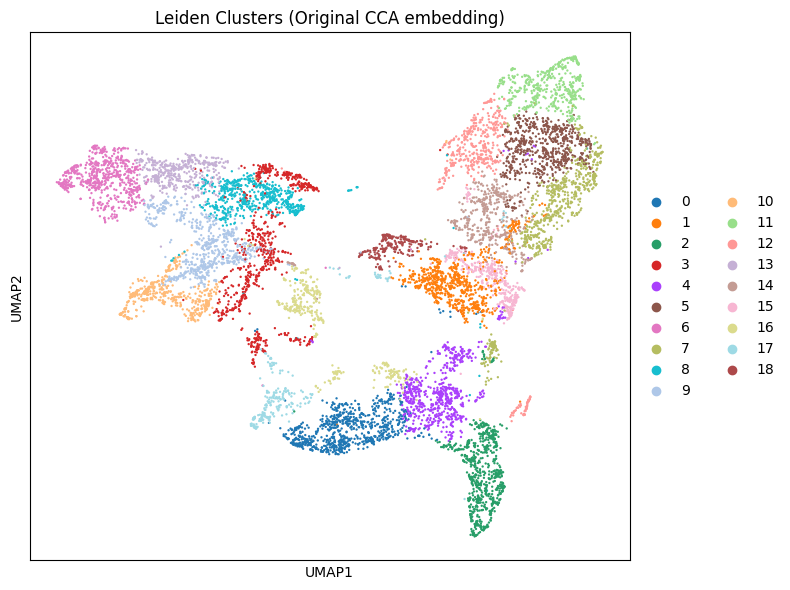


Cluster agreement between matched pairs: 23.8%


In [11]:
# Cluster using the best available embedding
# Works with or without Harmony batch correction

# Select embedding: prefer Harmony-corrected if available
if 'cca_adata_harmony' in dir() and hasattr(cca_adata_harmony, 'obsm') and 'X_harmony' in cca_adata_harmony.obsm:
    print("Using Harmony-corrected embedding for clustering")
    clustering_adata = cca_adata_harmony
    use_rep = 'X_harmony'
else:
    print("Using original CCA embedding for clustering (Harmony not run)")
    clustering_adata = cca_adata
    use_rep = None  # Use .X directly

# Build neighbor graph and cluster
sc.pp.neighbors(clustering_adata, n_neighbors=15, use_rep=use_rep)
sc.tl.umap(clustering_adata, min_dist=0.01, spread=2.5)
sc.tl.leiden(clustering_adata, resolution=1.0)

print(f"Found {len(clustering_adata.obs['leiden'].unique())} clusters")

# Visualize clusters
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
embedding_type = "Harmony-corrected" if use_rep == 'X_harmony' else "Original CCA"
sc.pl.umap(clustering_adata, color='leiden', ax=ax, show=False,
           title=f'Leiden Clusters ({embedding_type} embedding)')
plt.tight_layout()
plt.show()

# Check cluster agreement between matched RNA and Protein cells
n_pairs = len(rna_cca_scores)
rna_clusters = clustering_adata.obs['leiden'].values[:n_pairs]
prot_clusters = clustering_adata.obs['leiden'].values[n_pairs:]
agreement = (rna_clusters == prot_clusters).sum() / n_pairs * 100

print(f"\nCluster agreement between matched pairs: {agreement:.1f}%")
if agreement > 80:
    print("  GOOD: High agreement indicates successful integration")
elif agreement > 50:
    print("  MODERATE: Some integration achieved")
else:
    print("  WARNING: Low agreement suggests integration issues")

In [12]:
# Create a mapping from aligned RNA indices to cluster labels
# Uses clusters from the previous cell (works with either Harmony or original CCA)

# Get clusters - prefer clustering_adata if available, otherwise reconstruct
if 'clustering_adata' in dir():
    n_pairs = len(rna_cca_scores)
    rna_clusters = clustering_adata.obs['leiden'].values[:n_pairs]
elif 'cca_adata_harmony' in dir():
    n_pairs = len(rna_cca_scores)
    rna_clusters = cca_adata_harmony.obs['leiden'].values[:n_pairs]
else:
    n_pairs = len(rna_cca_scores)
    rna_clusters = cca_adata.obs['leiden'].values[:n_pairs]

rna_idx_to_cluster = dict(zip(aligned_rna_indices, rna_clusters))
print(f"Mapped {len(rna_idx_to_cluster)} RNA cells to clusters")

# Key markers for cell type identification in spleen
cell_type_markers = [
    'CD3E', 'CD4', 'CD8A',           # T cells
    'MS4A1', 'CD19',                  # B cells
    'CD14', 'CD68', 'CD163',          # Monocytes/Macrophages
    'PECAM1', 'CD34',                 # Endothelial
    'PTPRC',                          # Pan-leukocyte (CD45)
]

# Filter to available markers
available_markers = [m for m in cell_type_markers if m in rna_adata_lognorm.var_names]
print(f"Available markers for annotation: {len(available_markers)}")
print(f"  {available_markers}")

Mapped 5284 RNA cells to clusters
Available markers for annotation: 11
  ['CD3E', 'CD4', 'CD8A', 'MS4A1', 'CD19', 'CD14', 'CD68', 'CD163', 'PECAM1', 'CD34', 'PTPRC']


Spatial mapping: 155230 cells with cluster labels
Unique protein cells: 155230

Cluster distribution:
cluster
0     25174
1     21103
10     8136
11      951
12     4403
13     8190
14     2315
15     7133
16      790
17     6319
18      318
2       150
3     12000
4      9456
5      4586
6      3485
7      4555
8     19689
9     16477
Name: count, dtype: int64


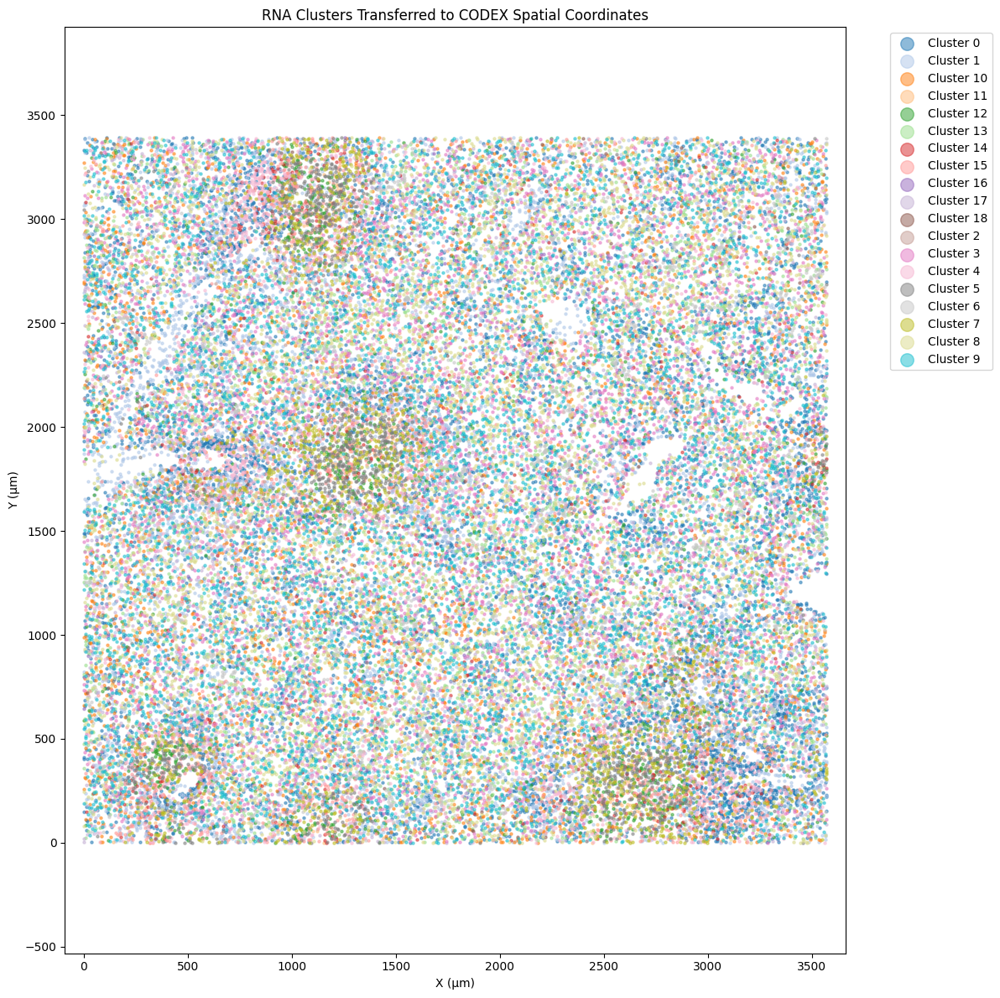

In [13]:
# Transfer cluster labels to CODEX spatial coordinates
spatial_records = []
for rna_idx, matches in rna_to_prot_matches.items():
    cluster = rna_idx_to_cluster.get(rna_idx)
    if cluster is None:
        continue
    for prot_idx, score in matches:
        spatial_records.append({
            'x': protein_adata.obs['X_centroid'].values[prot_idx],
            'y': protein_adata.obs['Y_centroid'].values[prot_idx],
            'rna_idx': rna_idx,
            'protein_idx': prot_idx,
            'match_score': score,
            'cluster': cluster
        })

spatial_df = pd.DataFrame(spatial_records)
print(f"Spatial mapping: {len(spatial_df)} cells with cluster labels")
print(f"Unique protein cells: {spatial_df['protein_idx'].nunique()}")
print(f"\nCluster distribution:")
print(spatial_df['cluster'].value_counts().sort_index())

# Plot clusters on spatial coordinates
from matplotlib import cm

unique_clusters = sorted(spatial_df['cluster'].unique())
n_clusters = len(unique_clusters)
colors = cm.tab20(np.linspace(0, 1, max(20, n_clusters)))
cluster_colors = {c: colors[i % 20] for i, c in enumerate(unique_clusters)}

# Subsample for plotting if needed
plot_df = spatial_df if len(spatial_df) <= 50000 else spatial_df.sample(n=50000, random_state=42)

plt.figure(figsize=(12, 12))
for cluster in unique_clusters:
    mask = plot_df['cluster'] == cluster
    plt.scatter(plot_df.loc[mask, 'x'], plot_df.loc[mask, 'y'],
                c=[cluster_colors[cluster]], s=5, alpha=0.5, label=f'Cluster {cluster}')

plt.xlabel('X (µm)')
plt.ylabel('Y (µm)')
plt.title('RNA Clusters Transferred to CODEX Spatial Coordinates')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=5)
plt.axis('equal')
plt.tight_layout()
plt.show()

## Step 10b: Harmony Batch Correction for Modality Mixing

**Harmony** is specifically designed to remove batch effects while preserving biological signal. 
Here we treat "modality" as a batch variable to force RNA and Protein cells to mix in the embedding.

This is the standard approach used in Seurat v3+ and other popular integration methods.

In [14]:
# Install and import harmony if needed
try:
    import harmonypy as hm
    print("Harmony loaded successfully")
except ImportError:
    print("Installing harmonypy...")
    import subprocess
    subprocess.check_call(['pip', 'install', 'harmonypy', '-q'])
    import harmonypy as hm
    print("Harmony installed and loaded")

Harmony loaded successfully


In [15]:
# Run Harmony on the stacked CCA embedding to mix modalities
# This treats 'modality' as a batch variable and iteratively corrects for it

print("Running Harmony batch correction...")
print("This will force RNA and Protein cells to mix while preserving biological clusters.\n")

# Create a fresh copy for Harmony
cca_adata_harmony = cca_adata.copy()

# Run Harmony - key parameter is theta (diversity clustering penalty)
# Higher theta = more aggressive mixing
harmony_out = hm.run_harmony(
    cca_adata_harmony.X,                    # The CCA embedding
    cca_adata_harmony.obs,                   # Metadata
    'modality',                              # Batch variable to correct
    theta=2.0,                               # Diversity penalty (default=2, higher=more mixing)
    max_iter_harmony=20,                     # Max iterations
    verbose=True
)

# Store corrected embedding
cca_adata_harmony.obsm['X_harmony'] = harmony_out.Z_corr.T

print(f"\nHarmony correction complete!")
print(f"Corrected embedding shape: {cca_adata_harmony.obsm['X_harmony'].shape}")

2026-01-14 17:47:08,972 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Running Harmony batch correction...
This will force RNA and Protein cells to mix while preserving biological clusters.



2026-01-14 17:47:09,463 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-01-14 17:47:09,479 - harmonypy - INFO - Iteration 1 of 20
2026-01-14 17:47:10,010 - harmonypy - INFO - Iteration 2 of 20
2026-01-14 17:47:10,482 - harmonypy - INFO - Iteration 3 of 20
2026-01-14 17:47:10,940 - harmonypy - INFO - Iteration 4 of 20
2026-01-14 17:47:11,396 - harmonypy - INFO - Converged after 4 iterations



Harmony correction complete!
Corrected embedding shape: (10568, 8)


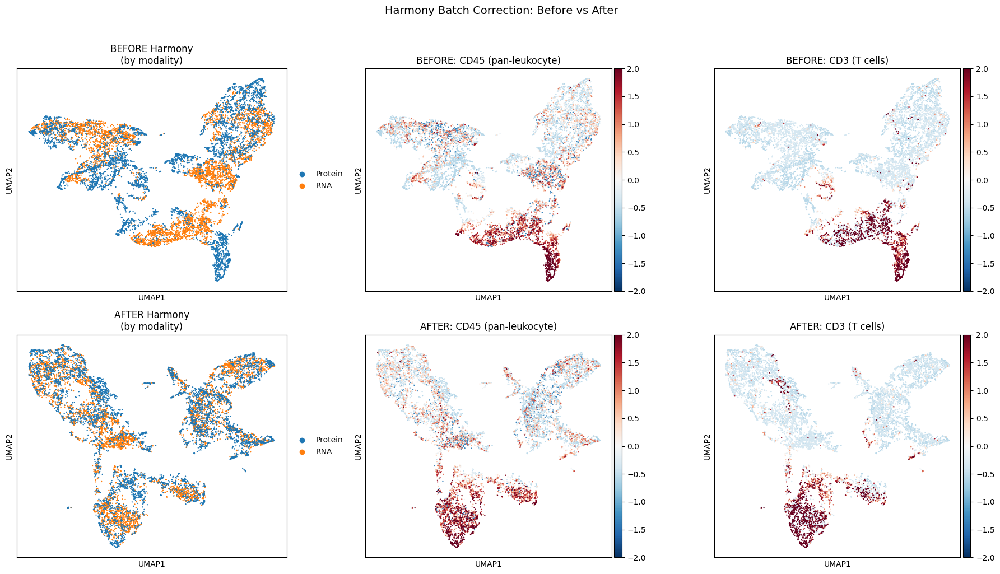


Matched pair distances (UMAP space):
  BEFORE Harmony - Mean: 5.67, Median: 4.89
  AFTER Harmony  - Mean: 5.33, Median: 3.72

  Improvement: 6.1% reduction in matched pair distance


In [17]:
# Compute UMAP on Harmony-corrected embedding and compare with original
# Requires running Harmony cells (17-18) first

if 'cca_adata_harmony' not in dir():
    print("Skipping: cca_adata_harmony not found. Run Harmony cells (17-18) first.")
else:
    # Compute UMAP on Harmony-corrected embedding and compare with original
    sc.pp.neighbors(cca_adata_harmony, n_neighbors=15, use_rep='X_harmony')
    sc.tl.umap(cca_adata_harmony, min_dist=0.01, spread=2.5)
    
    # Compare BEFORE and AFTER Harmony
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    
    # Row 1: Before Harmony (original CCA stacked)
    sc.pl.umap(cca_adata, color='modality', ax=axes[0, 0], show=False, 
               title='BEFORE Harmony\n(by modality)')
    
    # Add marker expression to cca_adata if not already there
    if 'CD45' not in cca_adata.obs.columns:
        # Add markers from matched data
        n_rna_emb = len(rna_cca_scores)
        marker_map = {'CD45': 'PTPRC', 'CD3e': 'CD3E'}
        for prot_marker, rna_gene in marker_map.items():
            marker_vals = np.zeros(cca_adata.n_obs)
            if rna_gene in rna_adata_lognorm.var_names:
                rna_idx = list(rna_adata_lognorm.var_names).index(rna_gene)
                rna_vals = rna_adata_lognorm.X[:, rna_idx]
                if sparse.issparse(rna_vals):
                    rna_vals = rna_vals.toarray().flatten()
                marker_vals[:n_rna_emb] = rna_vals[aligned_rna_indices]
            if prot_marker in protein_adata.var_names:
                prot_idx = list(protein_adata.var_names).index(prot_marker)
                for i, rna_idx in enumerate(aligned_rna_indices):
                    prot_indices = [m[0] for m in rna_to_prot_matches[rna_idx]]
                    marker_vals[n_rna_emb + i] = protein_adata.X[prot_indices, prot_idx].mean()
            # Z-score per modality
            rna_part = marker_vals[:n_rna_emb]
            prot_part = marker_vals[n_rna_emb:]
            if rna_part.std() > 0:
                marker_vals[:n_rna_emb] = (rna_part - rna_part.mean()) / rna_part.std()
            if prot_part.std() > 0:
                marker_vals[n_rna_emb:] = (prot_part - prot_part.mean()) / prot_part.std()
            cca_adata.obs[prot_marker] = marker_vals
    
    # Copy markers to harmony version
    for marker in ['CD45', 'CD3e']:
        if marker in cca_adata.obs.columns:
            cca_adata_harmony.obs[marker] = cca_adata.obs[marker].values
    
    sc.pl.umap(cca_adata, color='CD45', ax=axes[0, 1], show=False,
               title='BEFORE: CD45 (pan-leukocyte)', cmap='RdBu_r', vmin=-2, vmax=2)
    sc.pl.umap(cca_adata, color='CD3e', ax=axes[0, 2], show=False,
               title='BEFORE: CD3 (T cells)', cmap='RdBu_r', vmin=-2, vmax=2)
    
    # Row 2: After Harmony
    sc.pl.umap(cca_adata_harmony, color='modality', ax=axes[1, 0], show=False,
               title='AFTER Harmony\n(by modality)')
    sc.pl.umap(cca_adata_harmony, color='CD45', ax=axes[1, 1], show=False,
               title='AFTER: CD45 (pan-leukocyte)', cmap='RdBu_r', vmin=-2, vmax=2)
    sc.pl.umap(cca_adata_harmony, color='CD3e', ax=axes[1, 2], show=False,
               title='AFTER: CD3 (T cells)', cmap='RdBu_r', vmin=-2, vmax=2)
    
    plt.suptitle('Harmony Batch Correction: Before vs After', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Quantify improvement in matched pair distances
    umap_before = cca_adata.obsm['X_umap']
    umap_after = cca_adata_harmony.obsm['X_umap']
    n_pairs = len(rna_cca_scores)
    
    dist_before = np.linalg.norm(umap_before[:n_pairs] - umap_before[n_pairs:], axis=1)
    dist_after = np.linalg.norm(umap_after[:n_pairs] - umap_after[n_pairs:], axis=1)
    
    print(f"\nMatched pair distances (UMAP space):")
    print(f"  BEFORE Harmony - Mean: {dist_before.mean():.2f}, Median: {np.median(dist_before):.2f}")
    print(f"  AFTER Harmony  - Mean: {dist_after.mean():.2f}, Median: {np.median(dist_after):.2f}")
    improvement = (dist_before.mean() - dist_after.mean()) / dist_before.mean() * 100
    print(f"\n  Improvement: {improvement:.1f}% reduction in matched pair distance")

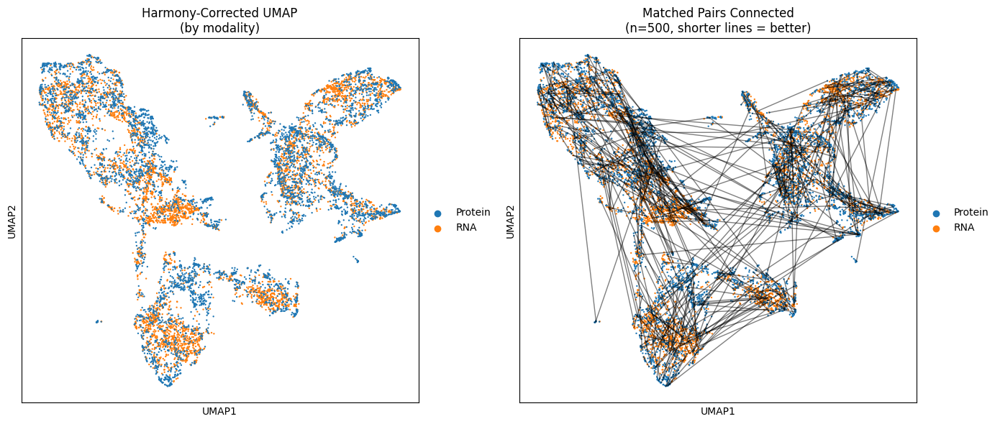


Integration Quality Metrics (Harmony-corrected):
  kNN accuracy (k=50): 7.5% of RNA cells have their matched protein in top-50 neighbors
  kNN accuracy (k=50): 7.2% of Protein cells have their matched RNA in top-50 neighbors
  Average: 7.4%


In [18]:
# Show matched pairs with connecting lines in Harmony-corrected UMAP
# Requires running Harmony cells (17-18) first

if 'cca_adata_harmony' not in dir():
    print("Skipping: cca_adata_harmony not found. Run Harmony cells (17-18) first.")
else:
    # Show matched pairs with connecting lines in Harmony-corrected UMAP
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Panel 1: Harmony UMAP with modality coloring
    sc.pl.umap(cca_adata_harmony, color='modality', ax=axes[0], show=False,
               title='Harmony-Corrected UMAP\n(by modality)')
    
    # Panel 2: Same with connecting lines
    umap_harmony = cca_adata_harmony.obsm['X_umap']
    n_pairs = len(rna_cca_scores)
    n_show = 500
    
    np.random.seed(42)
    pair_sample = np.random.choice(n_pairs, min(n_show, n_pairs), replace=False)
    
    for pair_idx in pair_sample:
        rna_pt = umap_harmony[pair_idx]
        prot_pt = umap_harmony[n_pairs + pair_idx]
        axes[1].plot([rna_pt[0], prot_pt[0]], [rna_pt[1], prot_pt[1]], 
                     'black', alpha=0.5, linewidth=1.0)
    
    sc.pl.umap(cca_adata_harmony, color='modality', ax=axes[1], show=False,
               title=f'Matched Pairs Connected\n(n={n_show}, shorter lines = better)')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate what percentage of matched pairs are within k neighbors
    from sklearn.neighbors import NearestNeighbors
    
    print("\nIntegration Quality Metrics (Harmony-corrected):")
    print("="*60)
    
    # kNN accuracy: what fraction of matched pairs are k-nearest neighbors?
    knn = NearestNeighbors(n_neighbors=50)
    knn.fit(cca_adata_harmony.obsm['X_harmony'])
    distances, indices = knn.kneighbors(cca_adata_harmony.obsm['X_harmony'])
    
    # For each RNA cell, check if its matched protein cell is in its k nearest neighbors
    knn_hits = 0
    for i in range(n_pairs):
        rna_neighbors = indices[i]
        matched_prot_idx = n_pairs + i  # The corresponding protein cell
        if matched_prot_idx in rna_neighbors:
            knn_hits += 1
    
    knn_accuracy = knn_hits / n_pairs * 100
    print(f"  kNN accuracy (k=50): {knn_accuracy:.1f}% of RNA cells have their matched protein in top-50 neighbors")
    
    # Also check from protein side
    knn_hits_prot = 0
    for i in range(n_pairs):
        prot_neighbors = indices[n_pairs + i]
        matched_rna_idx = i
        if matched_rna_idx in prot_neighbors:
            knn_hits_prot += 1
    
    knn_accuracy_prot = knn_hits_prot / n_pairs * 100
    print(f"  kNN accuracy (k=50): {knn_accuracy_prot:.1f}% of Protein cells have their matched RNA in top-50 neighbors")
    print(f"  Average: {(knn_accuracy + knn_accuracy_prot)/2:.1f}%")

## Step 10c: Enhanced Spatial Visualization

Create publication-quality spatial plots with:
- Cell type annotations based on marker expression
- Tissue region highlighting
- Multi-panel comparison views

Spatial mapping: 155230 cells with cluster labels

Marker availability check:
  T cell: 6/6 markers available
    Found: ['CD3E', 'CD3D', 'CD3G', 'CD4', 'CD8A', 'CD8B']
  B cell: 5/5 markers available
    Found: ['MS4A1', 'CD19', 'CD79A', 'CD79B', 'PAX5']
  Monocyte/Macrophage: 5/5 markers available
    Found: ['CD68', 'CD14', 'CD163', 'CSF1R', 'ITGAM']
  Endothelial: 9/9 markers available
    Found: ['PECAM1', 'VWF', 'CDH5', 'CD34', 'KDR', 'FLT1', 'CLDN5', 'ESAM', 'ERG']
  Smooth Muscle: 3/4 markers available
    Found: ['ACTA2', 'MYH11', 'TAGLN']
  Fibroblast: 2/5 markers available
    Found: ['COL1A1', 'COL1A2']

Cluster annotations:
  Cluster 0: T cell (T cell:0.29, B cell:0.07, Monocyte/Macrophage:0.01, Endothelial:0.01, Smooth Muscle:0.02, Fibroblast:0.01)
  Cluster 1: B cell (T cell:0.01, B cell:1.16, Monocyte/Macrophage:0.00, Endothelial:0.01, Smooth Muscle:0.02, Fibroblast:0.01)
  Cluster 10: Monocyte/Macrophage (T cell:0.05, B cell:0.05, Monocyte/Macrophage:0.98, Endothelial:

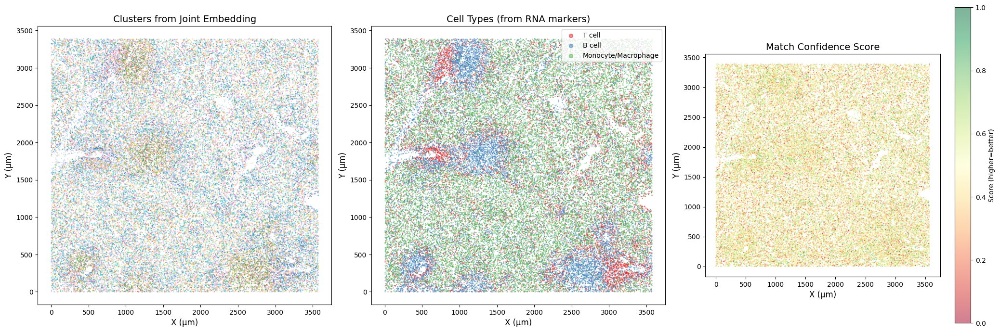


Cell type distribution:
cell_type
Monocyte/Macrophage    68767
B cell                 51683
T cell                 34780
Name: count, dtype: int64

Endothelial cells: 0 (0.0%)


In [19]:
# Enhanced Spatial Visualization with Cell Type Annotation
import os
from matplotlib import cm
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

# Create output directory
os.makedirs('results/3_visualization', exist_ok=True)

# Build spatial dataframe from matching results
spatial_records = []
for rna_idx, matches in rna_to_prot_matches.items():
    cluster = rna_idx_to_cluster.get(rna_idx)
    if cluster is None:
        continue
    for prot_idx, score in matches:
        spatial_records.append({
            'x': protein_adata.obs['X_centroid'].values[prot_idx],
            'y': protein_adata.obs['Y_centroid'].values[prot_idx],
            'rna_idx': rna_idx,
            'protein_idx': prot_idx,
            'match_score': score,
            'cluster': cluster
        })

spatial_df_vis = pd.DataFrame(spatial_records)
print(f"Spatial mapping: {len(spatial_df_vis)} cells with cluster labels")

# Define cell type markers - expanded list with alternatives
cell_type_markers = {
    'T cell': ['CD3E', 'CD3D', 'CD3G', 'CD4', 'CD8A', 'CD8B'],
    'B cell': ['MS4A1', 'CD19', 'CD79A', 'CD79B', 'PAX5'],
    'Monocyte/Macrophage': ['CD68', 'CD14', 'CD163', 'CSF1R', 'ITGAM'],
    'Endothelial': ['PECAM1', 'VWF', 'CDH5', 'CD34', 'KDR', 'FLT1', 'CLDN5', 'ESAM', 'ERG'],
    'Smooth Muscle': ['ACTA2', 'MYH11', 'TAGLN', 'CNN1'],
    'Fibroblast': ['COL1A1', 'COL1A2', 'DCN', 'LUM', 'FAP'],
}

# Check which markers are available
print("\nMarker availability check:")
for cell_type, markers in cell_type_markers.items():
    available = [m for m in markers if m in rna_adata_lognorm.var_names]
    print(f"  {cell_type}: {len(available)}/{len(markers)} markers available")
    if available:
        print(f"    Found: {available}")

# Cell type assignment based on cluster marker expression
cluster_annotations = {}
cluster_scores = {}

for cluster in spatial_df_vis['cluster'].unique():
    cluster_rna_indices = [rna_idx for rna_idx, c in rna_idx_to_cluster.items() if c == cluster]
    if len(cluster_rna_indices) == 0:
        cluster_annotations[cluster] = 'Other'
        continue
    
    scores = {}
    for cell_type, markers in cell_type_markers.items():
        total_score = 0
        n_markers = 0
        for marker in markers:
            if marker in rna_adata_lognorm.var_names:
                marker_idx = list(rna_adata_lognorm.var_names).index(marker)
                vals = rna_adata_lognorm.X[cluster_rna_indices, marker_idx]
                if sparse.issparse(vals):
                    vals = vals.toarray()
                total_score += vals.mean()
                n_markers += 1
        # Average score per available marker
        scores[cell_type] = total_score / max(n_markers, 1) if n_markers > 0 else 0
    
    cluster_scores[cluster] = scores
    best_type = max(scores, key=scores.get)
    best_score = scores[best_type]
    
    # Use relative threshold - best must be at least 0.1 and 50% higher than second best
    sorted_scores = sorted(scores.values(), reverse=True)
    second_best = sorted_scores[1] if len(sorted_scores) > 1 else 0
    
    if best_score > 0.1 and (second_best == 0 or best_score > second_best * 1.3):
        cluster_annotations[cluster] = best_type
    else:
        cluster_annotations[cluster] = 'Other'

# Print cluster annotations
print("\nCluster annotations:")
for cluster in sorted(cluster_annotations.keys()):
    ann = cluster_annotations[cluster]
    scores_str = ", ".join([f"{ct}:{s:.2f}" for ct, s in cluster_scores.get(cluster, {}).items() if s > 0])
    print(f"  Cluster {cluster}: {ann} ({scores_str})")

# Add cell type to spatial data
spatial_df_vis['cell_type'] = spatial_df_vis['cluster'].map(
    lambda x: cluster_annotations.get(x, 'Unknown')
)

# Create color palette for cell types
cell_type_colors = {
    'T cell': '#E41A1C',              # Red
    'B cell': '#377EB8',              # Blue
    'Monocyte/Macrophage': '#4DAF4A', # Green
    'Endothelial': '#984EA3',         # Purple
    'Smooth Muscle': '#FF7F00',       # Orange
    'Fibroblast': '#A65628',          # Brown
    'Other': '#999999',               # Gray
    'Unknown': '#CCCCCC',             # Light gray
}

# Plot
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

# Subsample for visualization
np.random.seed(42)
plot_df = spatial_df_vis if len(spatial_df_vis) <= 50000 else spatial_df_vis.sample(n=50000)

# Panel 1: By cluster
unique_clusters = sorted(plot_df['cluster'].unique())
cluster_cmap = cm.tab20(np.linspace(0, 1, max(20, len(unique_clusters))))
for i, cluster in enumerate(unique_clusters):
    mask = plot_df['cluster'] == cluster
    axes[0].scatter(plot_df.loc[mask, 'x'], plot_df.loc[mask, 'y'],
                    c=[cluster_cmap[i % 20]], s=0.5, alpha=0.5)
axes[0].set_xlabel('X (µm)', fontsize=12)
axes[0].set_ylabel('Y (µm)', fontsize=12)
axes[0].set_title('Clusters from Joint Embedding', fontsize=14)
axes[0].set_aspect('equal')

# Panel 2: By cell type
for cell_type in cell_type_colors.keys():
    mask = plot_df['cell_type'] == cell_type
    if mask.sum() > 0:
        axes[1].scatter(plot_df.loc[mask, 'x'], plot_df.loc[mask, 'y'],
                        c=cell_type_colors[cell_type], s=0.5, alpha=0.5, label=cell_type)
axes[1].set_xlabel('X (µm)', fontsize=12)
axes[1].set_ylabel('Y (µm)', fontsize=12)
axes[1].set_title('Cell Types (from RNA markers)', fontsize=14)
axes[1].legend(loc='upper right', markerscale=8, fontsize=10)
axes[1].set_aspect('equal')

# Panel 3: Match quality
scatter = axes[2].scatter(plot_df['x'], plot_df['y'],
                          c=plot_df['match_score'], s=0.5, alpha=0.5,
                          cmap='RdYlGn', vmin=0, vmax=1)
axes[2].set_xlabel('X (µm)', fontsize=12)
axes[2].set_ylabel('Y (µm)', fontsize=12)
axes[2].set_title('Match Confidence Score', fontsize=14)
axes[2].set_aspect('equal')
plt.colorbar(scatter, ax=axes[2], label='Score (higher=better)')

plt.tight_layout()
plt.savefig('results/3_visualization/spatial_overview.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nCell type distribution:")
print(spatial_df_vis['cell_type'].value_counts())

# Show endothelial-specific info
n_endo = (spatial_df_vis['cell_type'] == 'Endothelial').sum()
print(f"\nEndothelial cells: {n_endo} ({100*n_endo/len(spatial_df_vis):.1f}%)")

CELL-LEVEL ENDOTHELIAL DETECTION

Using endothelial markers: ['PECAM1', 'VWF', 'CDH5', 'ERG', 'CD34']

Endothelial score statistics:
  Mean:   0.036
  Median: 0.000
  95th percentile (threshold): 0.252
  Max:    0.993

Cells above threshold: 12269 (7.90%)

Endothelial cells by cluster:
  Cluster 3: 5944 cells (49.5% of cluster)
  Cluster 8: 2115 cells (10.7% of cluster)
  Cluster 13: 1938 cells (23.7% of cluster)
  Cluster 9: 886 cells (5.4% of cluster)
  Cluster 4: 353 cells (3.7% of cluster)
  Cluster 15: 254 cells (3.6% of cluster)
  Cluster 6: 235 cells (6.7% of cluster)
  Cluster 0: 183 cells (0.7% of cluster)
  Cluster 1: 176 cells (0.8% of cluster)
  Cluster 16: 87 cells (11.0% of cluster)
  Cluster 10: 53 cells (0.7% of cluster)
  Cluster 12: 40 cells (0.9% of cluster)
  Cluster 2: 5 cells (3.3% of cluster)


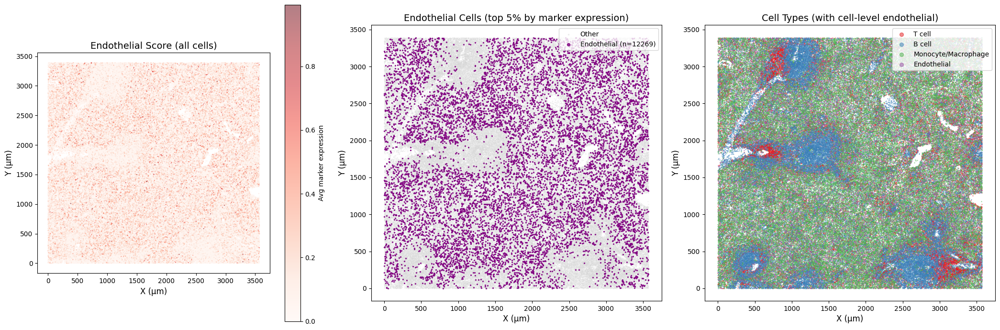


Final cell type distribution (with cell-level endothelial):
cell_type_with_endo
Monocyte/Macrophage    57509
B cell                 51213
T cell                 34239
Endothelial            12269
Name: count, dtype: int64


In [20]:
# Cell-level endothelial detection (not cluster-based)
# Endothelial cells are often rare and get absorbed into other clusters

print("=" * 60)
print("CELL-LEVEL ENDOTHELIAL DETECTION")
print("=" * 60)

# Key endothelial markers to check at cell level
endo_markers = ['PECAM1', 'VWF', 'CDH5', 'ERG', 'CD34']
available_endo = [m for m in endo_markers if m in rna_adata_lognorm.var_names]
print(f"\nUsing endothelial markers: {available_endo}")

# Calculate endothelial score for each matched RNA cell
endo_scores_per_cell = {}
for rna_idx in aligned_rna_indices:
    total_score = 0
    for marker in available_endo:
        marker_idx = list(rna_adata_lognorm.var_names).index(marker)
        val = rna_adata_lognorm.X[rna_idx, marker_idx]
        if sparse.issparse(val):
            val = val.toarray().flatten()[0]
        total_score += val
    endo_scores_per_cell[rna_idx] = total_score / len(available_endo)

# Add to spatial dataframe
spatial_df_vis['endo_score'] = spatial_df_vis['rna_idx'].map(endo_scores_per_cell)

# Identify high-endothelial cells using threshold
endo_threshold = np.percentile(list(endo_scores_per_cell.values()), 95)  # Top 5%
spatial_df_vis['is_endothelial'] = spatial_df_vis['endo_score'] > endo_threshold

n_endo_cells = spatial_df_vis['is_endothelial'].sum()
print(f"\nEndothelial score statistics:")
print(f"  Mean:   {np.mean(list(endo_scores_per_cell.values())):.3f}")
print(f"  Median: {np.median(list(endo_scores_per_cell.values())):.3f}")
print(f"  95th percentile (threshold): {endo_threshold:.3f}")
print(f"  Max:    {np.max(list(endo_scores_per_cell.values())):.3f}")
print(f"\nCells above threshold: {n_endo_cells} ({100*n_endo_cells/len(spatial_df_vis):.2f}%)")

# Show which clusters contain endothelial cells
print("\nEndothelial cells by cluster:")
endo_by_cluster = spatial_df_vis[spatial_df_vis['is_endothelial']].groupby('cluster').size()
for cluster, count in endo_by_cluster.sort_values(ascending=False).items():
    cluster_total = (spatial_df_vis['cluster'] == cluster).sum()
    print(f"  Cluster {cluster}: {count} cells ({100*count/cluster_total:.1f}% of cluster)")

# Visualize endothelial cells spatially
fig, axes = plt.subplots(1, 3, figsize=(21, 7))

# Panel 1: Endothelial score heatmap
scatter1 = axes[0].scatter(spatial_df_vis['x'], spatial_df_vis['y'],
                           c=spatial_df_vis['endo_score'], s=0.5, alpha=0.5,
                           cmap='Reds', vmin=0)
axes[0].set_xlabel('X (µm)', fontsize=12)
axes[0].set_ylabel('Y (µm)', fontsize=12)
axes[0].set_title('Endothelial Score (all cells)', fontsize=14)
axes[0].set_aspect('equal')
plt.colorbar(scatter1, ax=axes[0], label='Avg marker expression')

# Panel 2: Endothelial cells highlighted
non_endo = spatial_df_vis[~spatial_df_vis['is_endothelial']]
endo = spatial_df_vis[spatial_df_vis['is_endothelial']]
axes[1].scatter(non_endo['x'], non_endo['y'], c='lightgray', s=0.3, alpha=0.3, label='Other')
axes[1].scatter(endo['x'], endo['y'], c='purple', s=2, alpha=0.8, label=f'Endothelial (n={n_endo_cells})')
axes[1].set_xlabel('X (µm)', fontsize=12)
axes[1].set_ylabel('Y (µm)', fontsize=12)
axes[1].set_title(f'Endothelial Cells (top 5% by marker expression)', fontsize=14)
axes[1].legend(loc='upper right', markerscale=3)
axes[1].set_aspect('equal')

# Panel 3: Cell types with endothelial override
spatial_df_vis['cell_type_with_endo'] = spatial_df_vis.apply(
    lambda row: 'Endothelial' if row['is_endothelial'] else row['cell_type'], axis=1
)

cell_type_colors_endo = {
    'T cell': '#E41A1C',
    'B cell': '#377EB8',
    'Monocyte/Macrophage': '#4DAF4A',
    'Endothelial': '#984EA3',
    'Smooth Muscle': '#FF7F00',
    'Fibroblast': '#A65628',
    'Other': '#999999',
}

for cell_type, color in cell_type_colors_endo.items():
    mask = spatial_df_vis['cell_type_with_endo'] == cell_type
    if mask.sum() > 0:
        axes[2].scatter(spatial_df_vis.loc[mask, 'x'], spatial_df_vis.loc[mask, 'y'],
                        c=color, s=0.5, alpha=0.5, label=cell_type)
axes[2].set_xlabel('X (µm)', fontsize=12)
axes[2].set_ylabel('Y (µm)', fontsize=12)
axes[2].set_title('Cell Types (with cell-level endothelial)', fontsize=14)
axes[2].legend(loc='upper right', markerscale=8, fontsize=10)
axes[2].set_aspect('equal')

plt.tight_layout()
plt.savefig('results/3_visualization/endothelial_detection.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nFinal cell type distribution (with cell-level endothelial):")
print(spatial_df_vis['cell_type_with_endo'].value_counts())

## Step 10d: MARIO vs MaxFuse Comparison

Compare the integration results from both methods:
- Matching coverage
- Canonical correlation quality
- Computational efficiency

In [ ]:
# MaxFuse Results Summary
print("="*70)
print("MAXFUSE INTEGRATION SUMMARY")
print("="*70)

# MaxFuse results (from loaded checkpoint)
n_maxfuse_rna = rna_active.shape[0]
n_maxfuse_prot = protein_active.shape[0]
n_maxfuse_matched_rna = len(np.unique(full_matching[0]))
n_maxfuse_matched_prot = len(np.unique(full_matching[1]))

print(f"\n1. DATA SCALE")
print(f"   RNA cells: {n_maxfuse_rna:,}")
print(f"   Protein cells: {n_maxfuse_prot:,}")

print(f"\n2. MATCHING COVERAGE")
print(f"   Total matches: {len(full_matching[0]):,}")
print(f"   Unique RNA cells matched: {n_maxfuse_matched_rna:,} ({100*n_maxfuse_matched_rna/n_maxfuse_rna:.1f}%)")
print(f"   Unique Protein cells matched: {n_maxfuse_matched_prot:,} ({100*n_maxfuse_matched_prot/n_maxfuse_prot:.1f}%)")
print(f"   Mean match score: {np.mean(full_matching[2]):.3f}")

print(f"\n3. EMBEDDING QUALITY")
if 'cancor' in dir():
    print(f"   Mean canonical correlation (top 5): {cancor[:5].mean():.3f}")

print(f"\n4. KEY NOTES")
print("   - MaxFuse uses graph smoothing and pivot-based propagation")
print("   - Scales well to large datasets (>100K cells)")
print("   - For MARIO comparison, see 2_integration.ipynb")

## Step 11: Save Results

Save the integration results for downstream analysis.

In [21]:
# Save visualization results for downstream analysis
import os
import json as json_module
import pickle

results_dir = 'results/3_visualization'
os.makedirs(results_dir, exist_ok=True)

print("Saving visualization results...")
print("=" * 60)

# 1. Save MaxFuse matching
matching_df = pd.DataFrame({
    'rna_idx': full_matching[0],
    'protein_idx': full_matching[1],
    'score': full_matching[2]
})
matching_df.to_csv(f'{results_dir}/maxfuse_matching.csv', index=False)
print(f"1. MaxFuse matching: {len(matching_df):,} matches")

# 2. Save spatial mapping with cell types
if 'spatial_df_vis' in dir():
    spatial_df_vis.to_csv(f'{results_dir}/spatial_cell_types.csv', index=False)
    print(f"2. Spatial cell types: {len(spatial_df_vis):,} cells")
elif 'spatial_df' in dir():
    spatial_df.to_csv(f'{results_dir}/spatial_cell_types.csv', index=False)
    print(f"2. Spatial clusters: {len(spatial_df):,} cells")

# 3. Save cluster annotations mapping
if 'cluster_annotations' in dir():
    with open(f'{results_dir}/cluster_annotations.json', 'w') as f:
        json_module.dump({str(k): v for k, v in cluster_annotations.items()}, f, indent=2)
    print(f"3. Cluster annotations: {len(cluster_annotations)} clusters")

# 4. Save RNA index to cluster mapping
if 'rna_idx_to_cluster' in dir():
    with open(f'{results_dir}/rna_idx_to_cluster.pkl', 'wb') as f:
        pickle.dump(rna_idx_to_cluster, f)
    print(f"4. RNA-to-cluster mapping: {len(rna_idx_to_cluster):,} cells")

# 5. Save aligned RNA indices (protein matches are in rna_to_prot_matches)
if 'aligned_rna_indices' in dir():
    np.save(f'{results_dir}/aligned_rna_indices.npy', aligned_rna_indices)
    print(f"5. Aligned RNA indices: {len(aligned_rna_indices):,} cells")

# 6. Save CCA embeddings
if 'rna_cca_scores' in dir():
    np.save(f'{results_dir}/rna_cca_scores.npy', rna_cca_scores)
    np.save(f'{results_dir}/prot_cca_scores.npy', prot_cca_scores)
    print(f"6. CCA embeddings: {rna_cca_scores.shape}")

# 7. Save joint embedding AnnData
if 'cca_adata_harmony' in dir() and hasattr(cca_adata_harmony, 'obsm') and 'X_harmony' in cca_adata_harmony.obsm:
    cca_adata_harmony.write(f'{results_dir}/joint_embedding.h5ad')
    print(f"7. Joint embedding (Harmony): {cca_adata_harmony.shape}")
elif 'clustering_adata' in dir():
    clustering_adata.write(f'{results_dir}/joint_embedding.h5ad')
    print(f"7. Joint embedding: {clustering_adata.shape}")
elif 'cca_adata' in dir():
    cca_adata.write(f'{results_dir}/joint_embedding.h5ad')
    print(f"7. Joint embedding: {cca_adata.shape}")

# 8. Save RNA-to-protein matches dictionary
if 'rna_to_prot_matches' in dir():
    with open(f'{results_dir}/rna_to_prot_matches.pkl', 'wb') as f:
        pickle.dump(rna_to_prot_matches, f)
    print(f"8. RNA-to-protein match dict: {len(rna_to_prot_matches):,} RNA cells")

# 9. Save analysis parameters
vis_params = {
    'n_matched_pairs': len(aligned_rna_indices) if 'aligned_rna_indices' in dir() else 0,
    'n_clusters': len(cluster_annotations) if 'cluster_annotations' in dir() else 0,
    'cell_types': list(set(cluster_annotations.values())) if 'cluster_annotations' in dir() else [],
    'n_cca_components': rna_cca_scores.shape[1] if 'rna_cca_scores' in dir() else 0,
}
with open(f'{results_dir}/analysis_params.json', 'w') as f:
    json_module.dump(vis_params, f, indent=2)
print(f"9. Analysis parameters saved")

print("=" * 60)
print(f"\nAll outputs saved to {results_dir}/")
print("\nRun 5_analysis.ipynb for gene expression inference analysis.")

Saving visualization results...
1. MaxFuse matching: 155,230 matches
2. Spatial cell types: 155,230 cells
3. Cluster annotations: 19 clusters
4. RNA-to-cluster mapping: 5,284 cells
5. Aligned RNA indices: 5,284 cells
6. CCA embeddings: (5284, 8)
7. Joint embedding (Harmony): (10568, 8)
8. RNA-to-protein match dict: 5,284 RNA cells
9. Analysis parameters saved

All outputs saved to results/3_visualization/

Run 5_analysis.ipynb for gene expression inference analysis.
